                 Player  Year  FirstServe  FirstServePointsWon  \
0           Pedro Sousa  2016        0.88                 0.50   
1       Roman Safiullin  2017        0.84                 0.62   
2           Pedro Sousa  2017        0.83                 0.60   
3   Rogerio Dutra Silva  2010        0.83                 0.64   
4  Daniel Gimeno-Traver  2017        0.81                 0.54   

   FirstServeReturnPointsWon  SecondServePointsWon  \
0                       0.38                  0.50   
1                       0.26                  0.33   
2                       0.28                  0.53   
3                       0.34                  0.59   
4                       0.00                  0.33   

   SecondServeReturnPointsWon  Aces  BreakPointsConverted  BreakPointsFaced  \
0                        0.39     0                  0.14                 7   
1                        0.07     7                  0.00                 7   
2                        0.44     2      

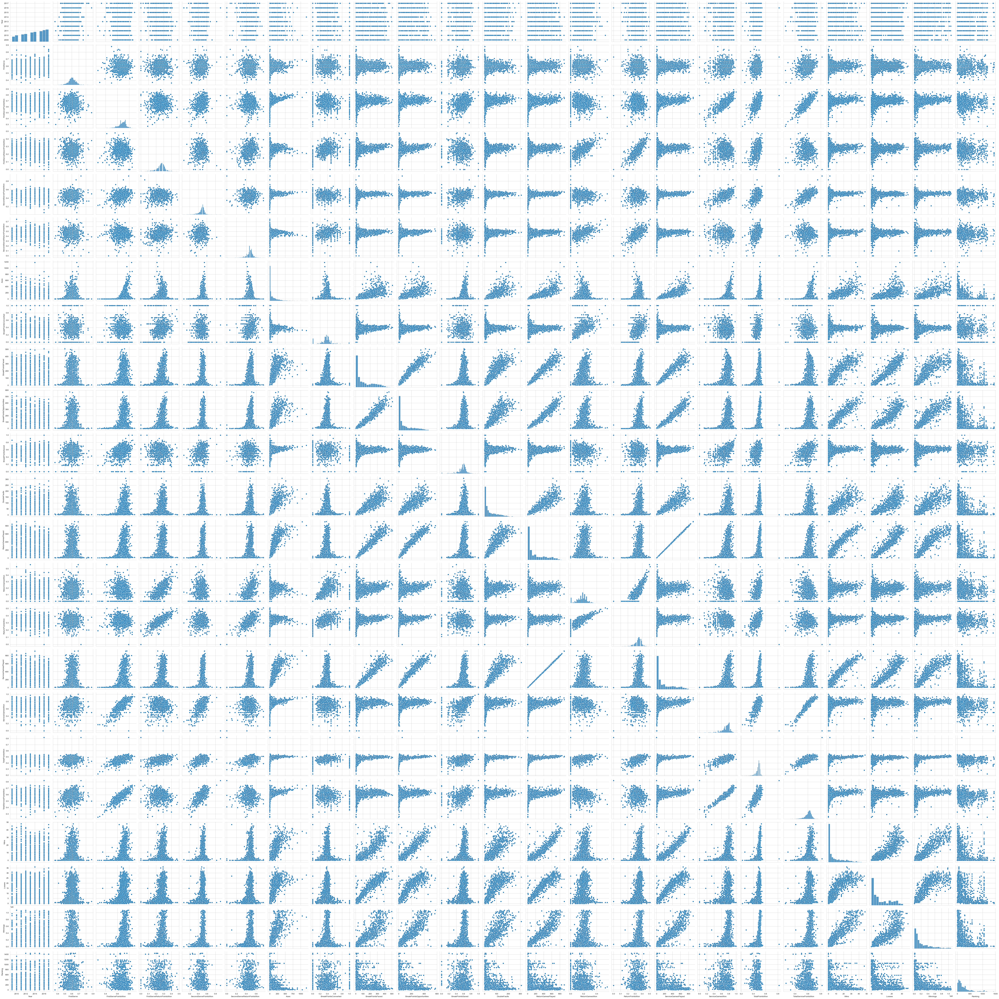

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import seaborn as sns

# load and investigate the data here:

df = pd.read_csv("tennis_stats.csv")
print(df.head())

sns.set_style("whitegrid")
sns.pairplot(df,height=3)
plt.show()



# perform exploratory analysis here:



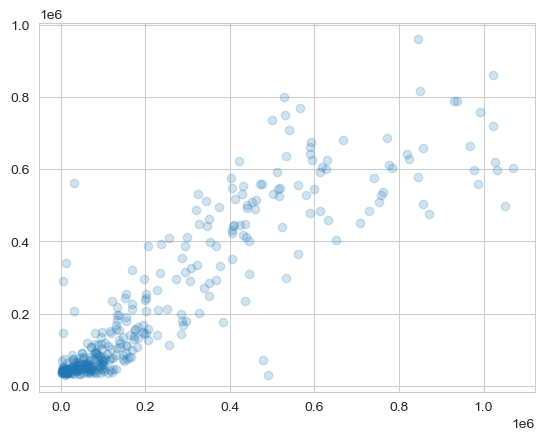

0.7944987352685737


In [15]:
BreakPointsFaced = df["BreakPointsFaced"].values.reshape(-1,1)
Winnings = df["Winnings"].values.reshape(-1,1)
line_fitter = LinearRegression()
BreakPointsFaced_train, BreakPointsFaced_test, Winnings_train, Winnings_test=train_test_split(BreakPointsFaced, Winnings, train_size=0.8, test_size=0.2)

model = line_fitter.fit(BreakPointsFaced_train, Winnings_train)
Winnings_predicted = model.predict(BreakPointsFaced_test)

plt.scatter(Winnings_test, Winnings_predicted, alpha = 0.2)
plt.show()
plt.clf()


print(model.score(BreakPointsFaced_test, Winnings_test))



## perform single feature linear regressions here:



## perform two feature linear regressions here:




## perform multiple feature linear regressions here:


Index(['Player', 'Year', 'FirstServe', 'FirstServePointsWon',
       'FirstServeReturnPointsWon', 'SecondServePointsWon',
       'SecondServeReturnPointsWon', 'Aces', 'BreakPointsConverted',
       'BreakPointsFaced', 'BreakPointsOpportunities', 'BreakPointsSaved',
       'DoubleFaults', 'ReturnGamesPlayed', 'ReturnGamesWon',
       'ReturnPointsWon', 'ServiceGamesPlayed', 'ServiceGamesWon',
       'TotalPointsWon', 'TotalServicePointsWon', 'Wins', 'Losses', 'Winnings',
       'Ranking'],
      dtype='object')
0.8102984372921436


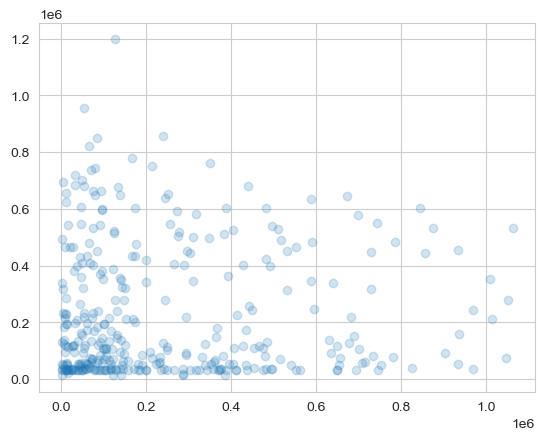

In [28]:
print(df.columns)

feature = df[["Aces", "Losses"]]


feature_train, feature_test,winnings_train, winnings_test=train_test_split(feature, Winnings, train_size=0.8, test_size=0.2)
multivar_model = line_fitter.fit(feature_train, winnings_train)
print(multivar_model.score(feature_test, winnings_test))

winnings_predicted = model.predict(feature_test)

plt.scatter(Winnings_test, winnings_predicted, alpha = 0.2)
plt.show()
plt.clf()